In [ ]:
!nvidia-smi

Sun Oct 15 06:26:24 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.105.17   Driver Version: 525.105.17   CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   36C    P8    11W /  70W |      0MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

#Load Model


In [ ]:
!pip install -i https://test.pypi.org/simple/ supervision==0.3.0
!pip install -q transformers
!pip install -q pytorch-lightning
!pip install -q roboflow
!pip install -q timm

Looking in indexes: https://test.pypi.org/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.7/7.7 MB 42.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 302.0/302.0 kB 32.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.8/3.8 MB 44.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 95.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 295.0/295.0 kB 37.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 774.6/774.6 kB 7.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 805.2/805.2 kB 54.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 2.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 155.3/155.3 kB 11.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.7/178.7 kB 24.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 8.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.1/49.1 

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import zipfile
import os

# Define the path to the ZIP file in your Google Drive
zip_file_path = '/content/drive/MyDrive/Football_Stage1/custom-model_1696671860.zip'

# Define the target directory where you want to extract the contents
target_directory = '/content/custom_model'

# Unzip the file
with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    zip_ref.extractall(target_directory)

# List the contents of the target directory
extracted_files = os.listdir(target_directory)
print("Contents of the extracted directory:", extracted_files)


Contents of the extracted directory: ['config.json', 'pytorch_model.bin']


In [ ]:
import torch
from transformers import DetrForObjectDetection, DetrConfig

# Settings
DEVICE = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')

# Load your custom model
model_directory = "/content/custom_model"
config_path = f"{model_directory}/config.json"
model_path = f"{model_directory}/pytorch_model.bin"

# Load the model with your custom configuration
config = DetrConfig.from_pretrained(config_path)
model = DetrForObjectDetection(config=config)
model.load_state_dict(torch.load(model_path, map_location=DEVICE))
model.to(DEVICE)


DetrForObjectDetection(
  (model): DetrModel(
    (backbone): DetrConvModel(
      (conv_encoder): DetrConvEncoder(
        (model): FeatureListNet(
          (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
          (bn1): DetrFrozenBatchNorm2d()
          (act1): ReLU(inplace=True)
          (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
          (layer1): Sequential(
            (0): Bottleneck(
              (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
              (bn1): DetrFrozenBatchNorm2d()
              (act1): ReLU(inplace=True)
              (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
              (bn2): DetrFrozenBatchNorm2d()
              (drop_block): Identity()
              (act2): ReLU(inplace=True)
              (aa): Identity()
              (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      

#Testing Model

In [ ]:
import os
HOME = os.getcwd()
print(HOME)

%cd {HOME}
!wget https://media.roboflow.com/notebooks/examples/dog.jpeg

IMAGE_NAME = "dog.jpeg"
IMAGE_PATH = os.path.join(HOME, IMAGE_NAME)

/content
/content
--2023-10-15 06:28:43--  https://media.roboflow.com/notebooks/examples/dog.jpeg
Resolving media.roboflow.com (media.roboflow.com)... 34.110.133.209
Connecting to media.roboflow.com (media.roboflow.com)|34.110.133.209|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 106055 (104K) [image/jpeg]
Saving to: ‘dog.jpeg’

dog.jpeg            100%[===================>] 103.57K  --.-KB/s    in 0.001s  

2023-10-15 06:28:43 (94.1 MB/s) - ‘dog.jpeg’ saved [106055/106055]



In [ ]:
import os
import torch
import cv2
import supervision as sv
from transformers import DetrForObjectDetection, DetrImageProcessor, DetrConfig


# Define paths
MODEL_DIRECTORY = "/content/custom_model"
CUSTOM_MODEL_CONFIG = os.path.join(MODEL_DIRECTORY, "config.json")
CUSTOM_MODEL_WEIGHTS = os.path.join(MODEL_DIRECTORY, "pytorch_model.bin")
IMAGE_PATH = "/content/1.png"
# IMAGE_PATH = "/content/dog.jpeg"

CONFIDENCE_TRESHOLD = 0.8
IOU_TRESHOLD = 0.8


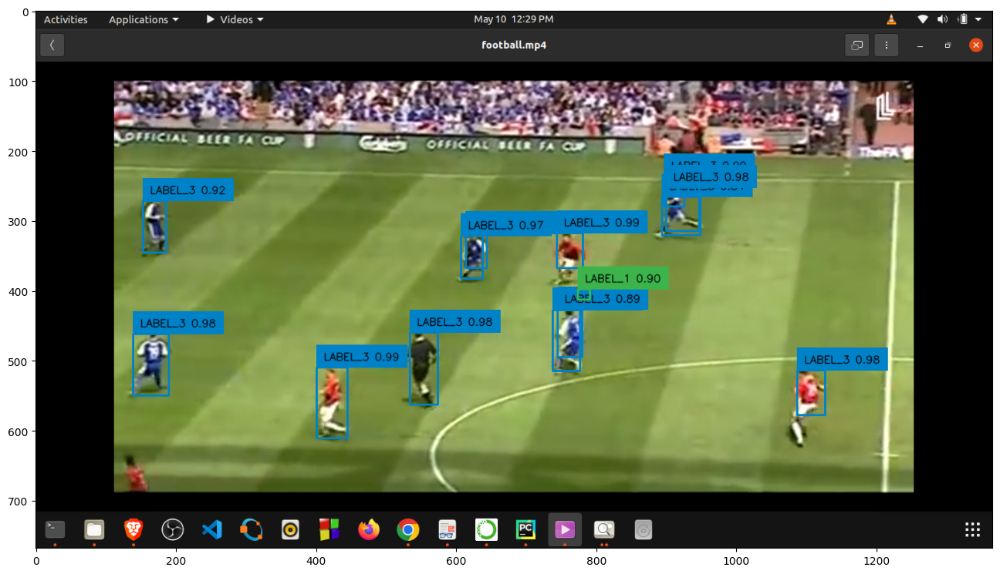

In [ ]:


# Load your custom model
DEVICE = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
config = DetrConfig.from_pretrained(CUSTOM_MODEL_CONFIG)
model = DetrForObjectDetection(config=config)
model.load_state_dict(torch.load(CUSTOM_MODEL_WEIGHTS, map_location=DEVICE))
model.to(DEVICE)

# Use 'facebook/detr-resnet-50' for the image processor
image_processor = DetrImageProcessor.from_pretrained('facebook/detr-resnet-50')

# Load and preprocess the image
image = cv2.imread(IMAGE_PATH)
inputs = image_processor(images=image, return_tensors='pt').to(DEVICE)

# Perform object detection on the image
with torch.no_grad():
    outputs = model(**inputs)

# Post-process the results
target_sizes = torch.tensor([image.shape[:2]]).to(DEVICE)
results = image_processor.post_process_object_detection(
    outputs=outputs,
    threshold=CONFIDENCE_TRESHOLD,  # You can adjust the confidence threshold
    target_sizes=target_sizes
)[0]

# Annotate and visualize the results
detections = sv.Detections.from_transformers(transformers_results=results)

labels = [f"{model.config.id2label[class_id]} {confidence:.2f}" for _, confidence, class_id, _ in detections]

box_annotator = sv.BoxAnnotator()
frame = box_annotator.annotate(scene=image, detections=detections, labels=labels)

# Display the annotated image
%matplotlib inline
sv.show_frame_in_notebook(frame, (16, 16))


# Infrence + NMS

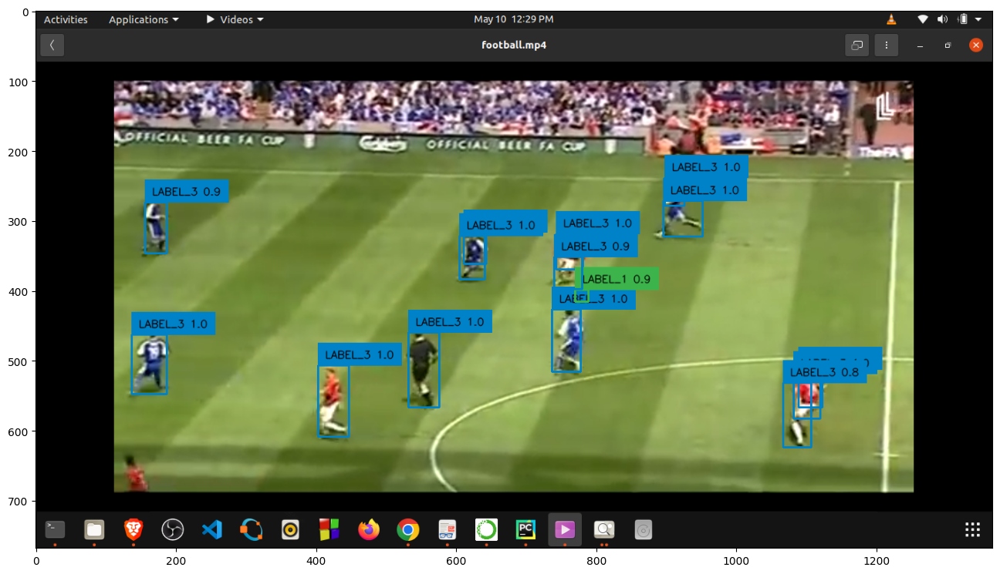

In [ ]:

with torch.no_grad():

    # Load the image and predict
    image = cv2.imread(IMAGE_PATH)
    inputs = image_processor(images=image, return_tensors='pt').to(DEVICE)
    outputs = model(**inputs)

    # Post-process
    target_sizes = torch.tensor([image.shape[:2]]).to(DEVICE)
    results = image_processor.post_process_object_detection(
        outputs=outputs,
        threshold=CONFIDENCE_TRESHOLD,
        target_sizes=target_sizes
    )[0]

# Apply Non-Maximum Suppression (NMS) to the detections
detections = sv.Detections.from_transformers(transformers_results=results).with_nms(threshold=IOU_TRESHOLD)

labels = [
    f"{model.config.id2label[class_id]} {confidence:0.1f}"
    for _, confidence, class_id, _
    in detections
]

box_annotator = sv.BoxAnnotator()
frame = box_annotator.annotate(scene=image, detections=detections, labels=labels)

%matplotlib inline
sv.show_frame_in_notebook(frame, (16, 16))


#DataSet


In [ ]:
from getpass import getpass

ROBOFLOW_API_KEY = getpass('Enter ROBOFLOW_API_KEY secret value: ')

Enter ROBOFLOW_API_KEY secret value: ··········


In [ ]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key=ROBOFLOW_API_KEY)
project = rf.workspace("nabeel").project("football_tracking_test")
dataset = project.version(3).download("coco")


loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Football_Tracking_Test-3 in coco:: 100%|██████████| 1872/1872 [00:00<00:00, 3887.90it/s]


In [ ]:
dataset.location

'/content/Football_Tracking_Test-3'

In [ ]:
import os
import torchvision


# settings
ANNOTATION_FILE_NAME = "_annotations.coco.json"
TRAIN_DIRECTORY = os.path.join(dataset.location, "train")
VAL_DIRECTORY = os.path.join(dataset.location, "valid")
TEST_DIRECTORY = os.path.join(dataset.location, "test")


class CocoDetection(torchvision.datasets.CocoDetection):
    def __init__(
        self,
        image_directory_path: str,
        image_processor,
        train: bool = True
    ):
        annotation_file_path = os.path.join(image_directory_path, ANNOTATION_FILE_NAME)
        super(CocoDetection, self).__init__(image_directory_path, annotation_file_path)
        self.image_processor = image_processor

    def __getitem__(self, idx):
        images, annotations = super(CocoDetection, self).__getitem__(idx)
        image_id = self.ids[idx]
        annotations = {'image_id': image_id, 'annotations': annotations}
        encoding = self.image_processor(images=images, annotations=annotations, return_tensors="pt")
        pixel_values = encoding["pixel_values"].squeeze()
        target = encoding["labels"][0]

        return pixel_values, target


TRAIN_DATASET = CocoDetection(
    image_directory_path=TRAIN_DIRECTORY,
    image_processor=image_processor,
    train=True)
VAL_DATASET = CocoDetection(
    image_directory_path=VAL_DIRECTORY,
    image_processor=image_processor,
    train=False)
TEST_DATASET = CocoDetection(
    image_directory_path=TEST_DIRECTORY,
    image_processor=image_processor,
    train=False)

print("Number of training examples:", len(TRAIN_DATASET))
print("Number of validation examples:", len(VAL_DATASET))
print("Number of test examples:", len(TEST_DATASET))

loading annotations into memory...
Done (t=0.37s)
creating index...
index created!
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
Number of training examples: 1813
Number of validation examples: 38
Number of test examples: 13


Image #1799


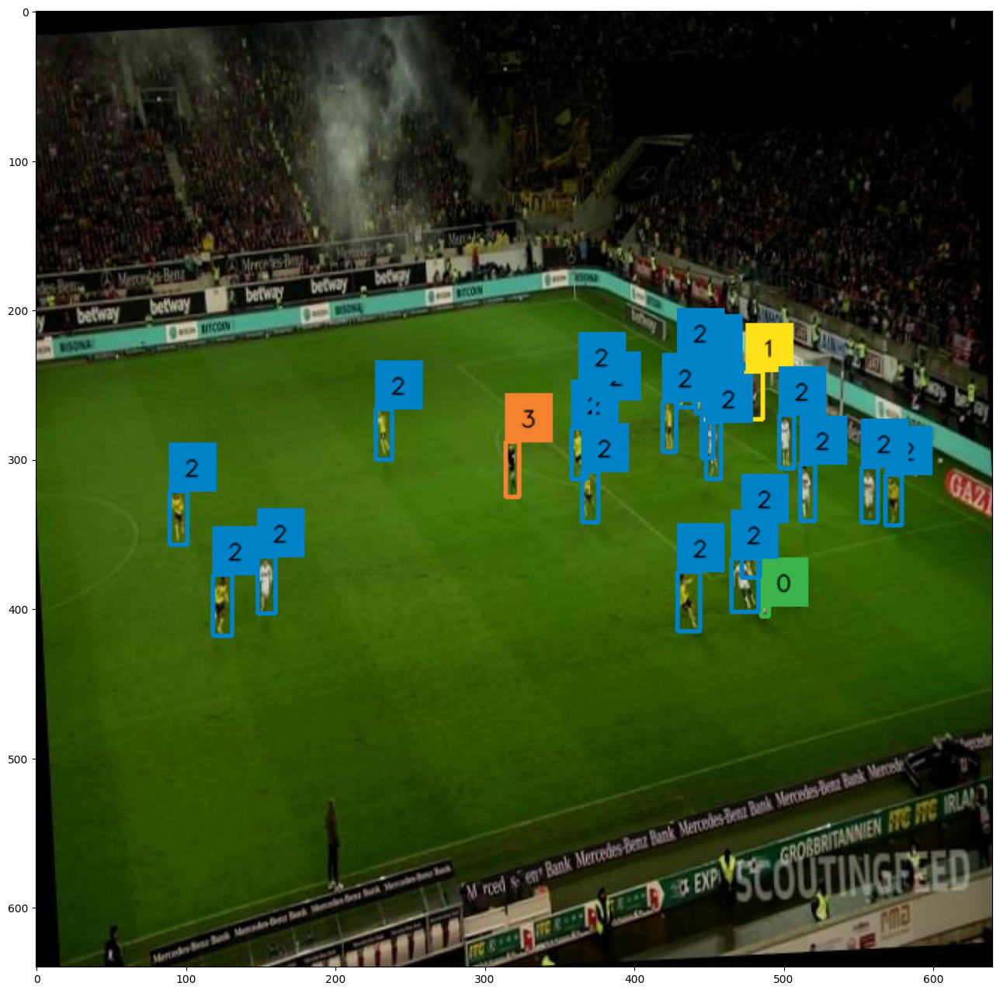

In [ ]:
import random
import cv2
import numpy as np


# select random image
image_ids = TRAIN_DATASET.coco.getImgIds()
image_id = random.choice(image_ids)
print('Image #{}'.format(image_id))

# load image and annotatons
image = TRAIN_DATASET.coco.loadImgs(image_id)[0]
annotations = TRAIN_DATASET.coco.imgToAnns[image_id]
image_path = os.path.join(TRAIN_DATASET.root, image['file_name'])
image = cv2.imread(image_path)

# annotate
detections = sv.Detections.from_coco_annotations(coco_annotation=annotations)

# we will use id2label function for training
categories = TRAIN_DATASET.coco.cats
id2label = {k: v['name'] for k,v in categories.items()}

labels = [
    f"{id2label[class_id]}"
    for _, _, class_id, _
    in detections
]

box_annotator = sv.BoxAnnotator()
frame = box_annotator.annotate(scene=image, detections=detections, labels=labels)

%matplotlib inline
sv.show_frame_in_notebook(image, (16, 16))

In [ ]:
from torch.utils.data import DataLoader

def collate_fn(batch):
    # DETR authors employ various image sizes during training, making it not possible
    # to directly batch together images. Hence they pad the images to the biggest
    # resolution in a given batch, and create a corresponding binary pixel_mask
    # which indicates which pixels are real/which are padding
    pixel_values = [item[0] for item in batch]
    encoding = image_processor.pad(pixel_values, return_tensors="pt")
    labels = [item[1] for item in batch]
    return {
        'pixel_values': encoding['pixel_values'],
        'pixel_mask': encoding['pixel_mask'],
        'labels': labels
    }

TRAIN_DATALOADER = DataLoader(dataset=TRAIN_DATASET, collate_fn=collate_fn, batch_size=4, shuffle=True)
VAL_DATALOADER = DataLoader(dataset=VAL_DATASET, collate_fn=collate_fn, batch_size=4)
TEST_DATALOADER = DataLoader(dataset=TEST_DATASET, collate_fn=collate_fn, batch_size=4)

In [ ]:
import pytorch_lightning as pl
from transformers import DetrForObjectDetection
import torch


class Detr(pl.LightningModule):

    def __init__(self, lr, lr_backbone, weight_decay):
        super().__init__()
        self.model = DetrForObjectDetection.from_pretrained(
            pretrained_model_name_or_path=config_path,
            num_labels=len(id2label),
            ignore_mismatched_sizes=True
        )

        self.lr = lr
        self.lr_backbone = lr_backbone
        self.weight_decay = weight_decay

    def forward(self, pixel_values, pixel_mask):
        return self.model(pixel_values=pixel_values, pixel_mask=pixel_mask)

    def common_step(self, batch, batch_idx):
        pixel_values = batch["pixel_values"]
        pixel_mask = batch["pixel_mask"]
        labels = [{k: v.to(self.device) for k, v in t.items()} for t in batch["labels"]]

        outputs = self.model(pixel_values=pixel_values, pixel_mask=pixel_mask, labels=labels)

        loss = outputs.loss
        loss_dict = outputs.loss_dict

        return loss, loss_dict

    def training_step(self, batch, batch_idx):
        loss, loss_dict = self.common_step(batch, batch_idx)
        # logs metrics for each training_step, and the average across the epoch
        self.log("training_loss", loss)
        for k,v in loss_dict.items():
            self.log("train_" + k, v.item())

        return loss

    def validation_step(self, batch, batch_idx):
        loss, loss_dict = self.common_step(batch, batch_idx)
        self.log("validation/loss", loss)
        for k, v in loss_dict.items():
            self.log("validation_" + k, v.item())

        return loss

    def configure_optimizers(self):
        # DETR authors decided to use different learning rate for backbone
        # you can learn more about it here:
        # - https://github.com/facebookresearch/detr/blob/3af9fa878e73b6894ce3596450a8d9b89d918ca9/main.py#L22-L23
        # - https://github.com/facebookresearch/detr/blob/3af9fa878e73b6894ce3596450a8d9b89d918ca9/main.py#L131-L139
        param_dicts = [
            {
                "params": [p for n, p in self.named_parameters() if "backbone" not in n and p.requires_grad]},
            {
                "params": [p for n, p in self.named_parameters() if "backbone" in n and p.requires_grad],
                "lr": self.lr_backbone,
            },
        ]
        return torch.optim.AdamW(param_dicts, lr=self.lr, weight_decay=self.weight_decay)

    def train_dataloader(self):
        return TRAIN_DATALOADER

    def val_dataloader(self):
        return VAL_DATALOADER

In [ ]:
%cd {HOME}

%load_ext tensorboard
%tensorboard --logdir lightning_logs/

In [ ]:
# model = Detr(lr=1e-3, lr_backbone=1e-5, weight_decay=1e-4)
model = Detr(lr=1e-5, lr_backbone=1e-6, weight_decay=1e-4)

batch = next(iter(TRAIN_DATALOADER))
outputs = model(pixel_values=batch['pixel_values'], pixel_mask=batch['pixel_mask'])

In [ ]:
class Detr(pl.LightningModule):
    def __init__(self):
        super().__init__()
        self.model = DetrForObjectDetection.from_pretrained(config_path)
        self.lr = 1e-3  # Set your desired learning rate here
        self.lr_backbone = 1e-5  # Set your desired learning rate for the backbone here
        self.weight_decay = 1e-4  # Set your desired weight decay here

    def configure_optimizers(self):
        param_dicts = [
            {
                "params": [p for n, p in self.named_parameters() if "backbone" not in n and p.requires_grad],
            },
            {
                "params": [p for n, p in self.named_parameters() if "backbone" in n and p.requires_grad],
                "lr": self.lr_backbone,
            },
        ]
        optimizer = torch.optim.AdamW(param_dicts, lr=self.lr, weight_decay=self.weight_decay)
        return optimizer


In [ ]:
outputs.logits.shape

torch.Size([1, 100, 6])

In [ ]:
from pytorch_lightning import Trainer

%cd {HOME}

# settings
# MAX_EPOCHS = 50
MAX_EPOCHS = 20

# pytorch_lightning < 2.0.0
# trainer = Trainer(gpus=1, max_epochs=MAX_EPOCHS, gradient_clip_val=0.1, accumulate_grad_batches=8, log_every_n_steps=5)

# pytorch_lightning >= 2.0.0
trainer = Trainer(devices=1, accelerator="gpu", max_epochs=MAX_EPOCHS, gradient_clip_val=0.1, accumulate_grad_batches=8, log_every_n_steps=5)

trainer.fit(model)

/content


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


TypeError: ignored

In [ ]:
MAX_EPOCHS =5

In [ ]:
import pytorch_lightning as pl
import torch

class CustomDetrLightningModule(pl.LightningModule):
    def __init__(self, model, lr, lr_backbone, weight_decay):
        super().__init__()
        self.model = model  # Your DetrForObjectDetection model
        self.lr = lr
        self.lr_backbone = lr_backbone
        self.weight_decay = weight_decay

    # Implement train_dataloader method to provide training data
    def train_dataloader(self):
        # Create and return your training data loader
        return TRAIN_DATALOADER  # Replace with your training data loader

    def forward(self, pixel_values, pixel_mask):
        return self.model(pixel_values=pixel_values, pixel_mask=pixel_mask)

    def training_step(self, batch, batch_idx):
        # Your training logic here
        pixel_values = batch["pixel_values"]
        pixel_mask = batch["pixel_mask"]
        labels = batch["labels"]

        outputs = self.model(pixel_values=pixel_values, pixel_mask=pixel_mask, labels=labels)

        # Calculate your loss and any other metrics here
        loss = outputs.loss

        self.log("train_loss", loss)  # Log the loss for monitoring

        return loss

    def configure_optimizers(self):
        # Configure your optimizer here, e.g., AdamW
        optimizer = torch.optim.AdamW(self.model.parameters(), lr=self.lr, weight_decay=self.weight_decay)
        return optimizer

# Create an instance of your CustomDetrLightningModule
custom_model = CustomDetrLightningModule(model, lr=0.001, lr_backbone=0.00001, weight_decay=0.0001)

# Initialize the Trainer and fit your custom model
trainer = pl.Trainer(max_epochs=MAX_EPOCHS, gradient_clip_val=0.1, accumulate_grad_batches=8, log_every_n_steps=5)
trainer.fit(custom_model)


INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name  | Type                   | Params
-------------------------------------------------
0 | model | DetrForObjectDetection | 41.5 M
-------------------------------------------------
41.3 M    Trainable params
222 K     Non-trainable params
41.5 M    Total params
166.011   Total estimated model params size (MB)


Training: |          | 0/? [00:00<?, ?it/s]

ValueError: ignored

Image #1500


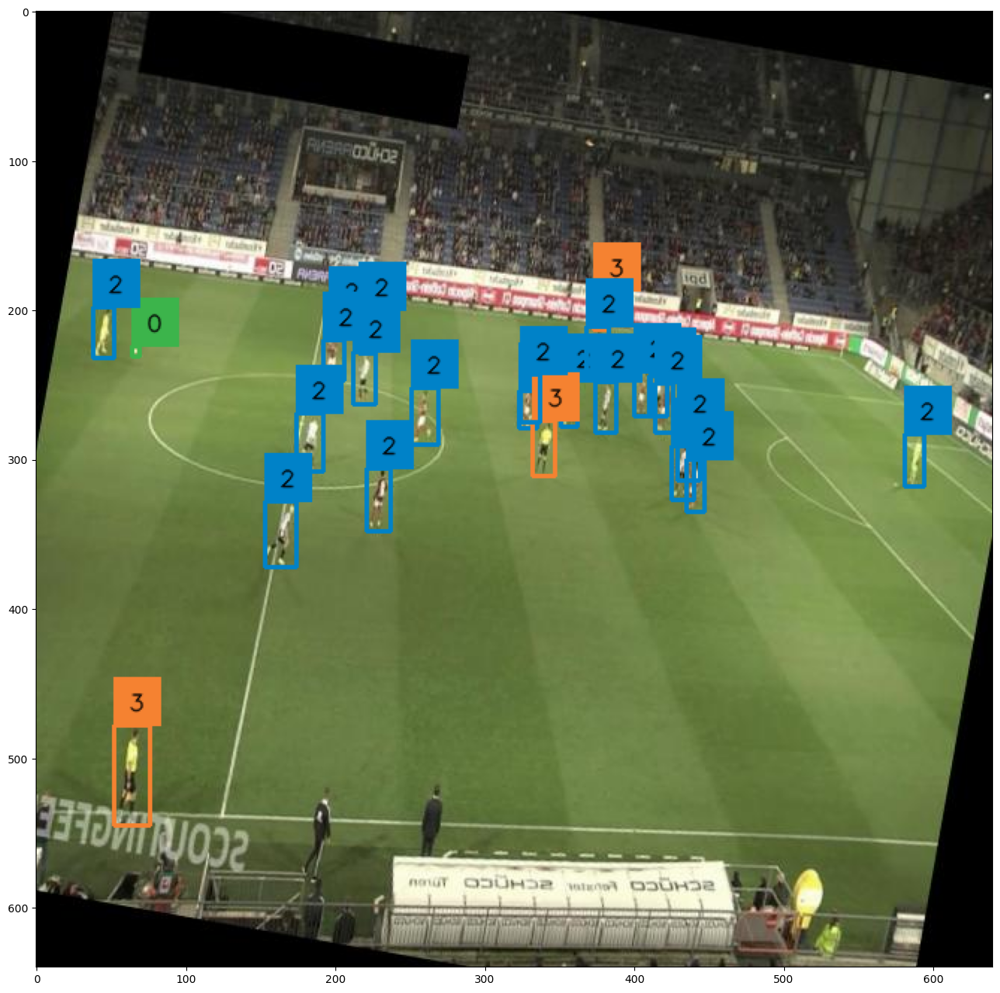

Image #283


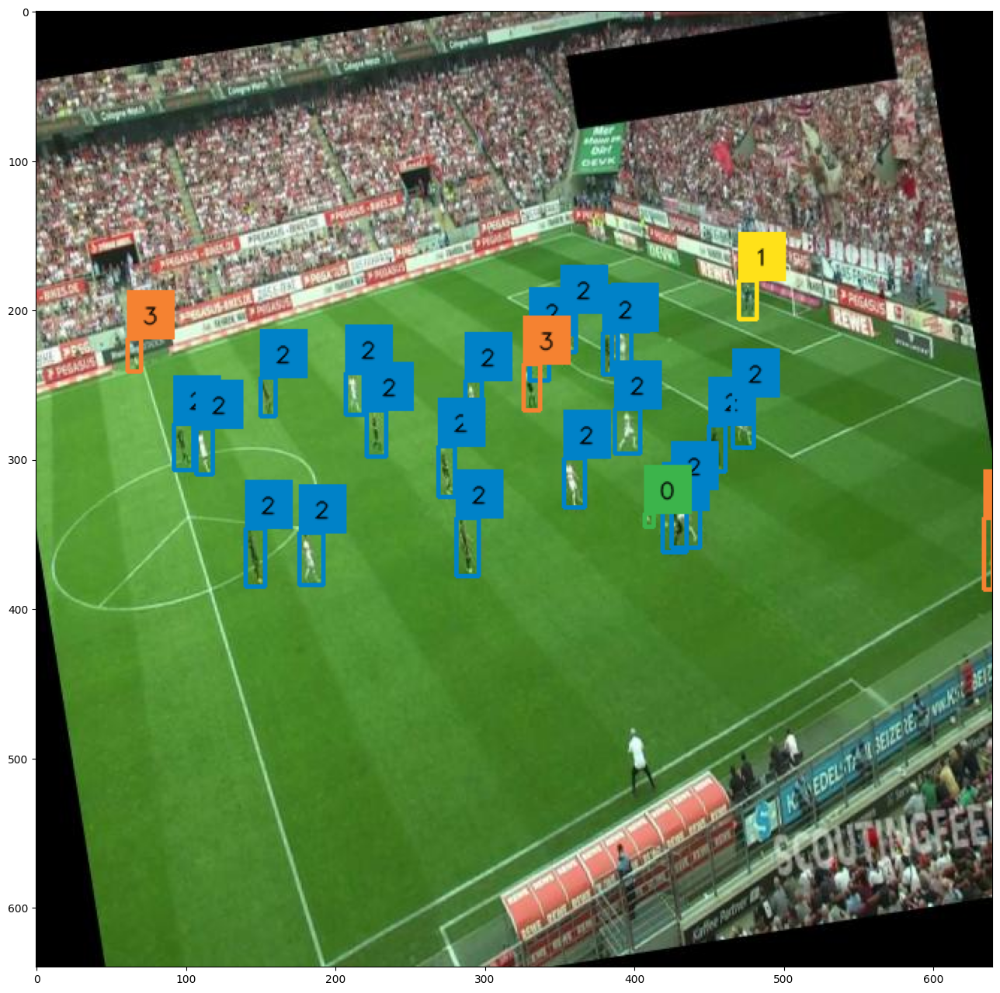

Image #1261


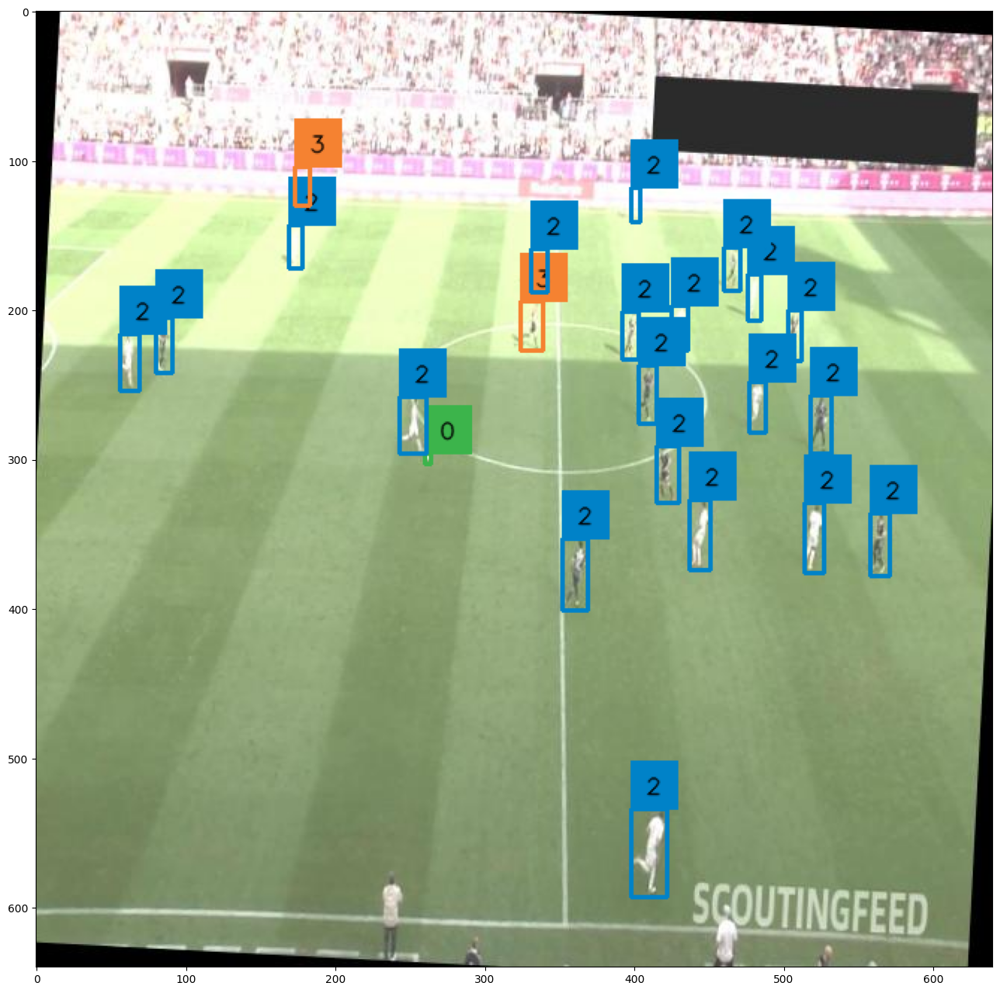

Image #1080


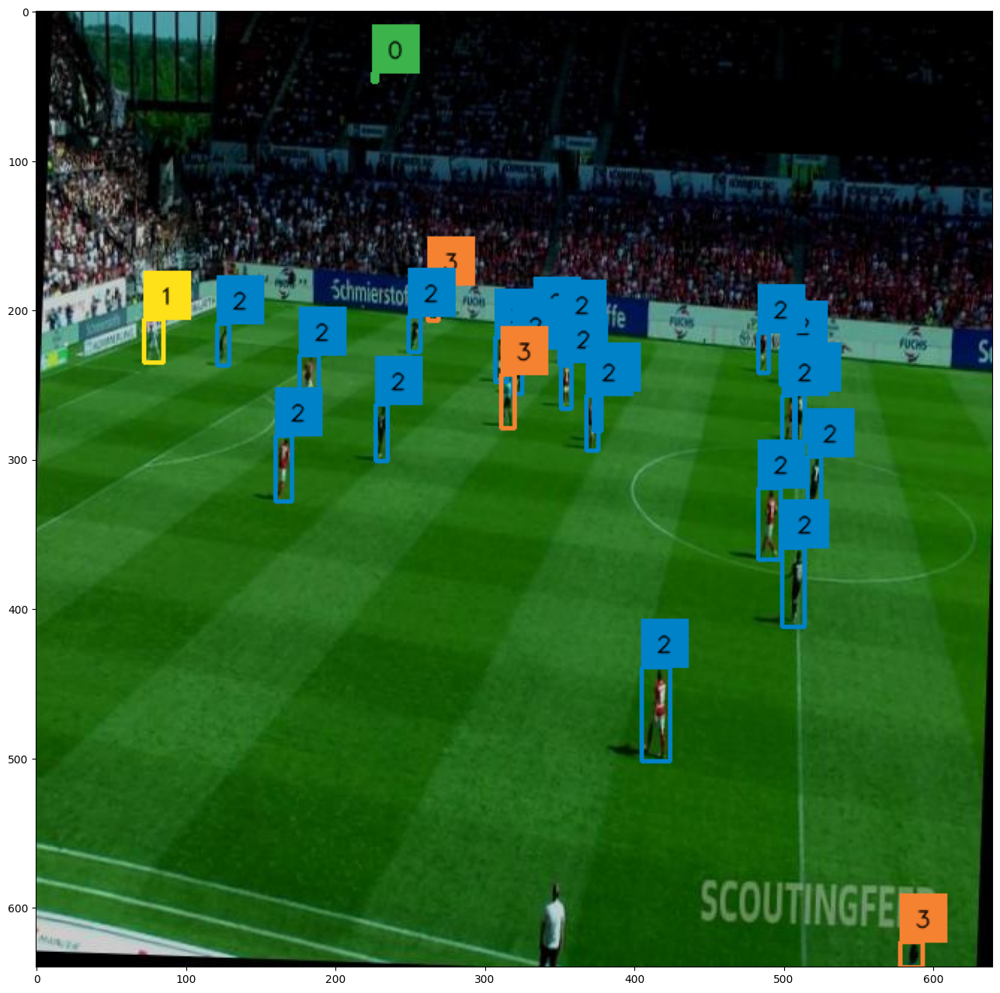

Image #1105


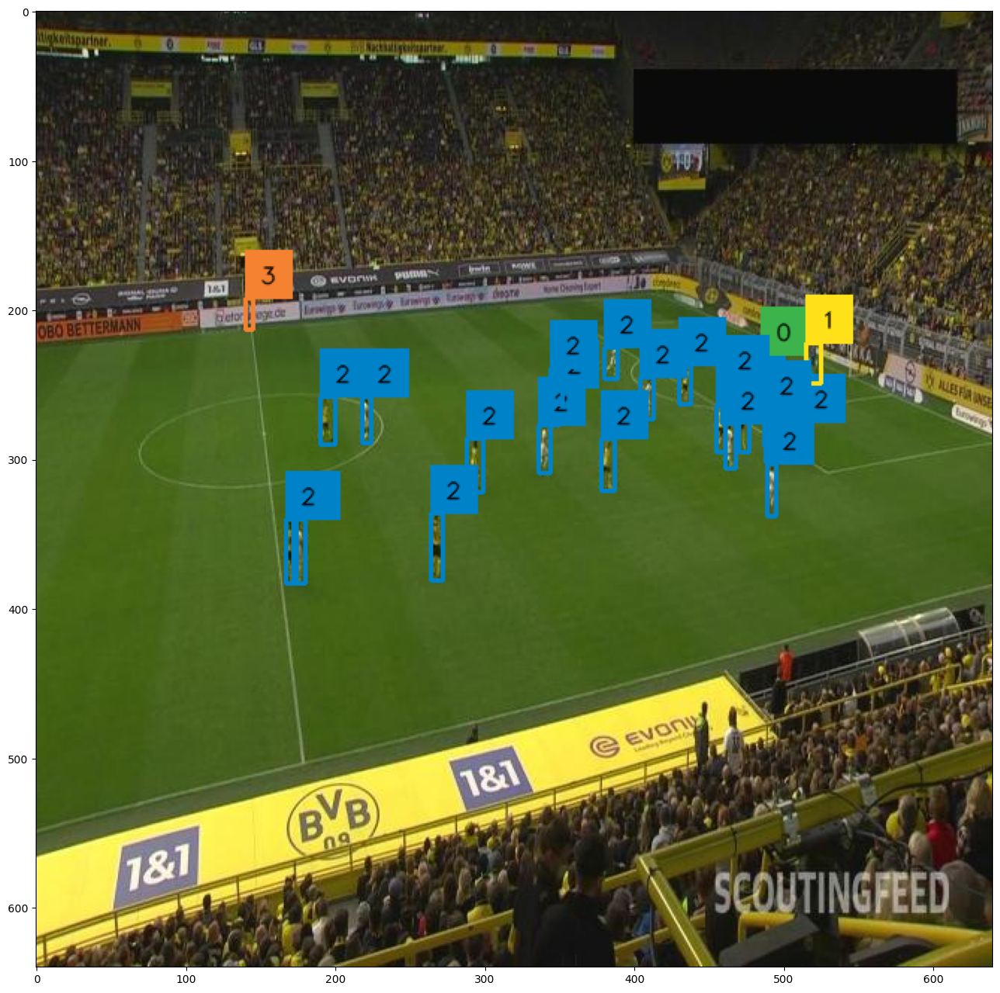

In [ ]:
import random
import cv2
import numpy as np

# Number of images to visualize
num_images_to_visualize = 5  # Adjust this as needed

# Loop through a random sample of images
for _ in range(num_images_to_visualize):
    # Select a random image
    image_ids = TRAIN_DATASET.coco.getImgIds()
    image_id = random.choice(image_ids)
    print('Image #{}'.format(image_id))

    # Load image and annotations
    image = TRAIN_DATASET.coco.loadImgs(image_id)[0]
    annotations = TRAIN_DATASET.coco.imgToAnns[image_id]
    image_path = os.path.join(TRAIN_DATASET.root, image['file_name'])
    image = cv2.imread(image_path)

    # Annotate the image with bounding boxes
    detections = sv.Detections.from_coco_annotations(coco_annotation=annotations)

    # Get class labels using id2label
    categories = TRAIN_DATASET.coco.cats
    id2label = {k: v['name'] for k, v in categories.items()}
    labels = [f"{id2label[class_id]}" for _, _, class_id, _ in detections]

    # Use BoxAnnotator to draw bounding boxes and labels
    box_annotator = sv.BoxAnnotator()
    frame = box_annotator.annotate(scene=image, detections=detections, labels=labels)

    # Display the annotated image
    %matplotlib inline
    sv.show_frame_in_notebook(image, (16, 16))
